In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sn
import numpy as np

from scipy.fft import fft, fftfreq
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from sklearn.cluster import OPTICS
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, silhouette_score

In [24]:
class CustomPlotter:

    @staticmethod
    def hist_and_boxplot(df: pd.DataFrame, col: str, ax=None, outlier_drop_pct=0):
        if ax is None:
            fig, (ax_hist, ax_boxplot) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), gridspec_kw={"height_ratios": (.85, .15), "hspace": 0.3})
        else:
            ax_hist, ax_boxplot = ax
        
        # Remove the top n% of data
        n_pct = int((outlier_drop_pct / 100) * len(df))
        
        df_ = df.sort_values(by=col).reset_index()
        df_ = df_.iloc[n_pct:]
        df_ = df_.iloc[:-n_pct]
        
        # Histogram with a vertical line at the mean value
        sn.histplot(data=df_, x=col, kde=False, ax=ax_hist)
        ax_hist.axvline(df_[col].mean(), color='r', linestyle='--', label=f'Mean: {df_[col].mean():.2f}')
        ax_hist.legend()
        ax_hist.set_title(f'Histogram and Boxplot for {col}')
        ax_hist.set_xlabel('')

        # Horizontal boxplot below the histogram
        sn.boxplot(data=df_, x=col, orient='h', ax=ax_boxplot)
        ax_boxplot.set_xlabel('')
        ax_boxplot.set_yticks([])

    @staticmethod
    def top_barplot_cat(df, col, ax=None, top_n_categories=10):
        if ax is None:
            ax = plt.gca()

        category_counts = df[col].value_counts(ascending=False).iloc[:top_n_categories]  # Select the N most frequent categories
        sn.barplot(x=list(category_counts.index), y=category_counts.values, palette='viridis', ax=ax)
        ax.set_title(f'Barplot for {col} (Top {top_n_categories} Ordered by Frequency)')
        ax.set_xlabel(col)
        ax.set_ylabel('Frequency')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)  # Rotate labels to prevent overlap

    @staticmethod
    def num_vs_target(df: pd.DataFrame, col: str, target: str, ax: plt.Axes = None):
        # Create the scatter plot and regression line in the provided Axes object
        if ax is None:
            ax = plt.gca()

        # Create scatter plot with regression line
        sn.scatterplot(data=df, x=col, y=target, alpha=0.7, ax=ax)
        ax.set_title(f"Scatter plot of {col} vs {target}")

        # Calculate and plot the linear regression line
        no_nan_data = df.dropna()
        X = no_nan_data[col].values.reshape(-1, 1)
        Y = no_nan_data[target].values.reshape(-1, 1)
        model = LinearRegression()
        model.fit(X, Y)
        y_pred = model.predict(X)

        y_min = df[target].min()
        y_max = df[target].max()
        y_range = y_max - y_min

        y_min -= y_range * .02
        y_max += y_range * .02

        ax.set_ylim((y_min, y_max))

        ax.plot(X, y_pred, color="red", linestyle="--", label="Linear regression")
        ax.legend()

    @staticmethod
    def cat_vs_target(df: pd.DataFrame, col: str, target: str, ax: plt.Axes = None, log_attrs=[]):
        # Sort categories by mean value
        category_order = df.groupby(col)[target].median().sort_values(ascending=False).index

        # Create boxplot for categorical columns in the provided Axes object
        if ax is None:
            ax = plt.gca()

        boxplot = sn.boxplot(data=df, x=col, y=target, order=category_order, ax=ax)
        ax.set_title(f"Boxplot of {target} by {col}")

        # Tilt category labels and adjust font size
        num_categories = len(category_order)
        
        if col in log_attrs: ax.set_yscale('log')

        fontsize = 8 if num_categories > 10 else 10
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=fontsize, ha="right")

    @staticmethod
    def combined_plots(df, columns, target, figsize=(14, 8), outlier_drop_pct=0, log_attrs=[]):
        sn.set_style('whitegrid')
        for col in columns:
            if col == target:
                continue
            fig = plt.figure(figsize=figsize)
            fig.suptitle(f'Analysis of {col}', fontsize=16)
            gs = fig.add_gridspec(6, 2)

            ax_target = fig.add_subplot(gs[:, 1])

            if pd.api.types.is_numeric_dtype(df[col]):
                ax_hist = fig.add_subplot(gs[:5, 0])
                ax_box = fig.add_subplot(gs[5, 0])
                CustomPlotter.hist_and_boxplot(df, col, ax=(ax_hist, ax_box), outlier_drop_pct=outlier_drop_pct)
                CustomPlotter.num_vs_target(df, col, target, ax=ax_target)
            else:
                ax_bp = fig.add_subplot(gs[:, 0])
                CustomPlotter.top_barplot_cat(df, col, ax=ax_bp, top_n_categories=10)
                CustomPlotter.cat_vs_target(df, col, target, ax=ax_target, log_attrs=log_attrs)
            
            plt.tight_layout()
            plt.show()
    
    @staticmethod
    def plot_histogram_boxplot(data, title, ax_hist, ax_box):
        sn.histplot(data=data, kde=True, ax=ax_hist)
        ax_hist.axvline(data.mean(), color='red', linestyle='--')
        ax_hist.set_title(title + ' Histogram')
        
        sn.boxplot(x=data, orient='h', ax=ax_box)
        ax_box.set_title(title + ' Boxplot')
        ax_box.set_yticks([])

    @staticmethod
    def find_optimal_period(data, min_period, max_period):
        best_period = None
        min_rss = np.inf

        for period in range(min_period, max_period + 1, 15):
            try:
                decomposition = STL(data, period=period).fit()
                residuals = decomposition.resid.dropna()
                rss = np.sum(residuals ** 2)

                if rss < min_rss:
                    min_rss = rss
                    best_period = period
            except ValueError:
                continue

        return best_period

    @staticmethod
    def plot_timeseries_decomposition(data, title, ax):
        min_period = 12
        max_period = 12 * 5 * 51
        optimal_period = CustomPlotter.find_optimal_period(data, min_period, max_period)

        decomposition = STL(data, period=optimal_period).fit()
        trend = decomposition.trend.dropna()
        seasonal = decomposition.seasonal.dropna()
        resid = decomposition.resid.dropna()

        ax[0].plot(data, label='Original')
        ax[0].set_title(title + ' Time Series [%d]' % optimal_period)
        
        ax[1].plot(trend, label='Trend')
        ax[1].set_title(title + ' Trend [%d]' % optimal_period)
        
        ax[2].plot(seasonal, label='Seasonality')
        ax[2].set_title(title + ' Seasonality [%d]' % optimal_period)
        
        ax[3].plot(resid, label='Residuals [%d]' % optimal_period)
        ax[3].set_title(title + ' Residuals')

    @staticmethod
    def plot_fft(data, title, ax):
        N = len(data)
        T = 10 * 60  # 10 minutes in seconds
        yf = fft(data.to_numpy())
        xf = fftfreq(N, T)[:N // 2]

        # Plot the FFT with logarithmic scale and real frequency (in Hz)
        ax.plot(xf, 20 * np.log10(2.0 / N * np.abs(yf[:N // 2])))
        ax.set_title(title + ' Frequency Domain')
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Amplitude (dB)')
    
    @staticmethod
    def time_series_analysis(df, attribute):
        if attribute == 'Date Time':
            return

        data = df[attribute].dropna()

        sn.set(style='whitegrid')
        fig = plt.figure(figsize=(16, 12))
        fig.suptitle(f'Analysis of {attribute}', fontsize=16)
        
        # Create subplots with different heights
        gs = fig.add_gridspec(6, 2)
        ax_hist = fig.add_subplot(gs[:3, 0])
        ax_box = fig.add_subplot(gs[3, 0])
        ax_ts = [fig.add_subplot(gs[i, 1]) for i in range(4)]
        ax_fft = fig.add_subplot(gs[4:, :])

        # Call plotting functions
        CustomPlotter.plot_histogram_boxplot(data, attribute, ax_hist, ax_box)
        CustomPlotter.plot_timeseries_decomposition(data, attribute, ax_ts)
        CustomPlotter.plot_fft(data, attribute, ax_fft)
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    @staticmethod
    def plot_autocorrelation(df, attribute):
        data = df[attribute].dropna()
        
        fig, ax = plt.subplots(figsize=(8, 4))
        autocorrelation_plot(data, ax=ax)
        ax.set_title(f'Autocorrelation of {attribute}')
        plt.show()

    @staticmethod
    def plot_corrmatrix(df, figsize=(12, 10)):
        corr_matrix = df.corr()

        # Set up a Seaborn theme
        sn.set_theme(style="white")

        # Create a correlation matrix plot
        plt.figure(figsize=figsize)
        mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Create a mask to display only the lower triangle
        cmap = sn.diverging_palette(230, 20, as_cmap=True)  # Generate a custom diverging colormap
        sn.heatmap(corr_matrix, mask=mask, cmap=cmap, center=0, annot=True, fmt=".2f",
                    square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"fontsize": 10})
        plt.title("Correlation Matrix")
        plt.show()

    @staticmethod
    def autocorrelation_analysis(df):
        for attribute in df.columns:
            CustomPlotter.plot_autocorrelation(df, attribute)


In [5]:
df = pd.read_csv('../datasets/data_project_vgm.csv').drop(columns=['diff12', 's12', 's', 'ema12L'])
df['t'] = pd.to_datetime(df['t'])
df = df.set_index(['t', 'symbol'])
df = df.sort_index()
df

o       h       l       c       v     n  \
t                   symbol                                                 
2018-01-02 09:00:00 BABA    173.46  173.90  173.03  173.77   12094    92   
2018-01-02 10:00:00 BABA    173.90  174.00  173.83  174.00    7456    28   
2018-01-02 11:00:00 BABA    174.15  174.70  174.02  174.58    9966    93   
2018-01-02 12:00:00 BABA    174.50  174.98  174.25  174.72   65516   405   
2018-01-02 13:00:00 BABA    174.68  175.33  174.40  175.00  105976   696   
...                            ...     ...     ...     ...     ...   ...   
2023-03-31 23:00:00 MSFT    288.32  288.54  288.31  288.54   12680   223   
                    NVDA    277.88  278.25  277.88  278.00   36408  1130   
                    PFE      40.80   40.80   40.75   40.79    7620    26   
                    TSLA    207.56  208.00  207.56  207.65  441819  6899   
                    XOM     109.49  109.60  109.49  109.60     550     5   

                                    vw      diff      emaS      emaM  ...  \
t                   symbol                                            ...   
2018-01-02 09:00:00 BABA    173.478710  1.004939  1.000886  1.000067  ...   
2018-01-02 10:00:00 BABA    173.896286  1.002407  1.001139  1.000127  ...   
2018-01-02 11:00:00 BABA    174.341312  1.002559  1.001376  1.000190  ...   
2018-01-02 12:00:00 BABA    174.598031  1.001473  1.001392  1.000223  ...   
2018-01-02 13:00:00 BABA    174.928519  1.001893  1.001475  1.000265  ...   
...                                ...       ...       ...       ...  ...   
2023-03-31 23:00:00 MSFT    288.393916  1.000425  1.001030  1.000653  ...   
                    NVDA    278.053342  1.001477  1.001086  1.000722  ...   
                    PFE      40.784097  1.000443  1.000872  1.000293  ...   
                    TSLA    207.848732  1.001852  1.002891  1.001552  ...   
                    XOM     109.574455  1.000354  1.000038  1.000402  ...   

                            EPS_Growth       ROE       ROA  Gross_Margin  \
t                   symbol                                                 
2018-01-02 09:00:00 BABA    352.666667  0.068788  0.033837      0.577516   
2018-01-02 10:00:00 BABA    352.666667  0.068788  0.033837      0.577516   
2018-01-02 11:00:00 BABA    352.666667  0.068788  0.033837      0.577516   
2018-01-02 12:00:00 BABA    352.666667  0.068788  0.033837      0.577516   
2018-01-02 13:00:00 BABA    352.666667  0.068788  0.033837      0.577516   
...                                ...       ...       ...           ...   
2023-03-31 23:00:00 MSFT     -0.012766  0.089687  0.045055      0.677641   
                    NVDA      0.500000  0.103538  0.060642      0.651978   
                    PFE      -0.359551  0.052205  0.025350      0.602800   
                    TSLA      0.133333  0.082476  0.044779      0.237561   
                    XOM      -0.235955  0.065368  0.034547      0.961479   

                            Operating_Margin  Net_Profit_Margin  \
t                   symbol                                        
2018-01-02 09:00:00 BABA            0.313099           0.289938   
2018-01-02 10:00:00 BABA            0.313099           0.289938   
2018-01-02 11:00:00 BABA            0.313099           0.289938   
2018-01-02 12:00:00 BABA            0.313099           0.289938   
2018-01-02 13:00:00 BABA            0.313099           0.289938   
...                                      ...                ...   
2023-03-31 23:00:00 MSFT            0.392047           0.315671   
                    NVDA            0.376038           0.346896   
                    PFE             0.216179           0.205599   
                    TSLA            0.160416           0.151616   
                    XOM             0.922560           0.133607   

                            Current_Ratio  Debt_to_Equity           FCF  \
t                   symbol                                                
2018-01-02 09:00:00 BABA       

In [6]:
df.groupby(level='symbol').apply(lambda x: x['vw'].ewm(span=77).corr(x['spy_value']))

symbol  t                    symbol
AAPL    2018-04-02 08:00:00  AAPL           NaN
        2018-04-02 09:00:00  AAPL     -1.000000
        2018-04-02 10:00:00  AAPL      0.991604
        2018-04-02 11:00:00  AAPL      0.912633
        2018-04-02 12:00:00  AAPL      0.919528
                                         ...   
XOM     2023-03-31 19:00:00  XOM       0.869318
        2023-03-31 20:00:00  XOM       0.863235
        2023-03-31 21:00:00  XOM       0.855184
        2023-03-31 22:00:00  XOM       0.849194
        2023-03-31 23:00:00  XOM       0.844304
Length: 254265, dtype: float64

In [7]:
short_term = 11
long_term = 77

market_correlation_func = lambda x: pd.DataFrame(x['vw'].ewm(span=long_term).corr(x['spy_value']))
df['market_correlation'] = df.groupby(level='symbol').apply(market_correlation_func)

market_long_term_trend = lambda x: pd.DataFrame((x['spy_value'] / x['spy_value'].shift(1)).ewm(span=long_term).mean())
df['market_long_term_trend'] = df.groupby(level='symbol').apply(market_long_term_trend)

market_short_term_trend = lambda x: pd.DataFrame((x['spy_value'] / x['spy_value'].shift(1)).ewm(span=short_term).mean())
df['market_short_term_trend'] = df.groupby(level='symbol').apply(market_short_term_trend)

def market_change(x):
    diff = x['spy_value'] / x['spy_value'].shift(1)
    s = diff.ewm(span=77).std()
    m = diff.ewm(span=77).mean()
    return pd.DataFrame((diff - m) / s)
df['market_change'] = df.groupby(level='symbol').apply(market_change)

In [8]:
def compute_alpha_beta(group, window_size=77):
    stock_returns = group['vw'].pct_change(periods=12)
    SPY_returns = group['spy_value'].pct_change(periods=12)
    
    rolling_cov = stock_returns.rolling(window=window_size).cov(SPY_returns)
    rolling_var = SPY_returns.rolling(window=window_size).var()
    
    beta = rolling_cov / rolling_var
    alpha = stock_returns - beta * SPY_returns
    
    return pd.DataFrame({'alpha': alpha, 'beta': beta})

# Group the dataset by symbol and apply the function to each group
alpha_beta = df.groupby(level='symbol').apply(compute_alpha_beta)

df[['alpha', 'beta']] = alpha_beta
#alpha_beta.groupby('symbol').get_group('AAPL').sort_values(by='beta')['beta'][100:-100].hist(bins=50)

alpha_beta

alpha      beta
t                   symbol                    
2018-01-02 09:00:00 BABA         NaN       NaN
2018-01-02 10:00:00 BABA         NaN       NaN
2018-01-02 11:00:00 BABA         NaN       NaN
2018-01-02 12:00:00 BABA         NaN       NaN
2018-01-02 13:00:00 BABA         NaN       NaN
...                              ...       ...
2023-03-31 23:00:00 MSFT   -0.005440  1.711806
                    NVDA   -0.004400  1.974550
                    PFE     0.000970  0.654125
                    TSLA    0.021296  2.997253
                    XOM    -0.002742  0.200828

[254265 rows x 2 columns]

<AxesSubplot:>

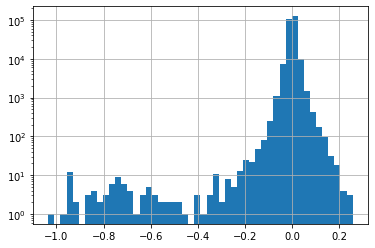

In [9]:
alpha_beta['alpha'].hist(bins=50, log=True)

In [10]:
df.dropna().head()

,,o,h,l,c,v,n,vw,diff,emaS,emaM,...,Current_Ratio,Debt_to_Equity,FCF,spy_value,market_correlation,market_long_term_trend,market_short_term_trend,market_change,alpha,beta
t,symbol,,,,,,,,,,,,,,,,,,,,,
2018-01-09 17:00:00,BABA,191.4800,192.4900,190.85,191.3400,3198510,21279,191.855173,1.006067,1.001276,1.000710,...,1.966388,0.369558,4.475100e+10,274.906617,0.924569,1.000302,1.000421,0.250500,-0.001221,2.613199
2018-01-09 18:00:00,BABA,191.3350,191.6500,190.37,190.6899,1701489,11510,190.966318,0.995367,1.000291,1.000573,...,1.966388,0.369558,4.475100e+10,274.981654,0.923528,1.000301,1.000396,-0.023165,-0.005315,2.226711
2018-01-09 19:00:00,BABA,190.6964,190.8608,189.78,190.6410,1650885,13218,190.282255,0.996418,0.999645,1.000466,...,1.966388,0.369558,4.475100e+10,275.004265,0.919015,1.000295,1.000344,-0.177747,-0.006000,1.607908
2018-01-09 20:00:00,BABA,190.6500,191.2201,190.49,190.8000,2551084,18238,190.915457,1.003328,1.000259,1.000540,...,1.966388,0.369558,4.475100e+10,274.634979,0.919796,1.000248,1.000063,-1.314675,0.000317,1.313781
2018-01-09 21:00:00,BABA,190.7300,190.8500,190.60,190.7100,371372,96,190.798348,0.999387,1.000114,1.000510,...,1.966388,0.369558,4.475100e+10,274.407183,0.920745,1.000218,0.999914,-0.868099,-0.001348,1.077236


In [11]:
df.reset_index().to_csv('final_dataset.csv')

In [12]:
df.groupby('symbol')

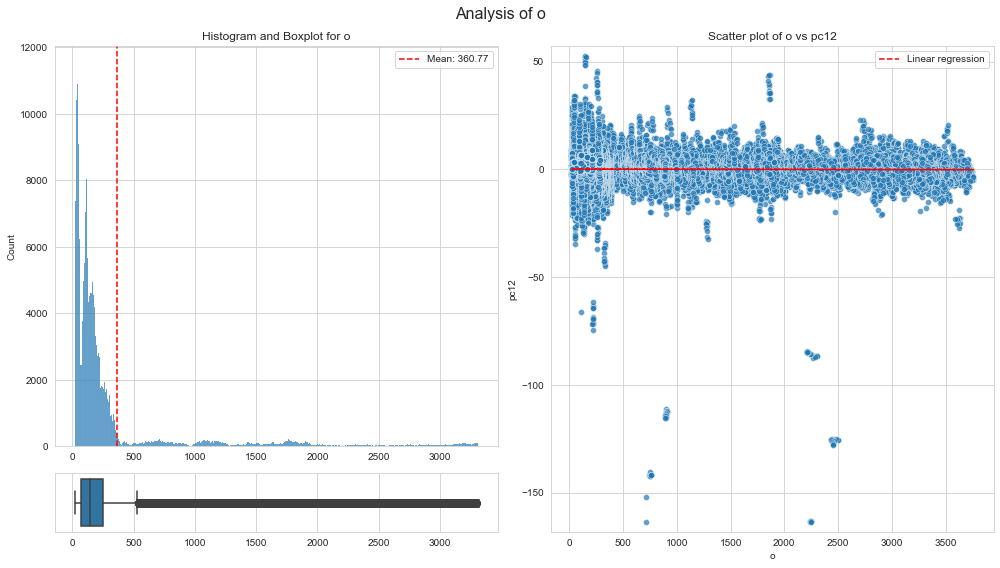

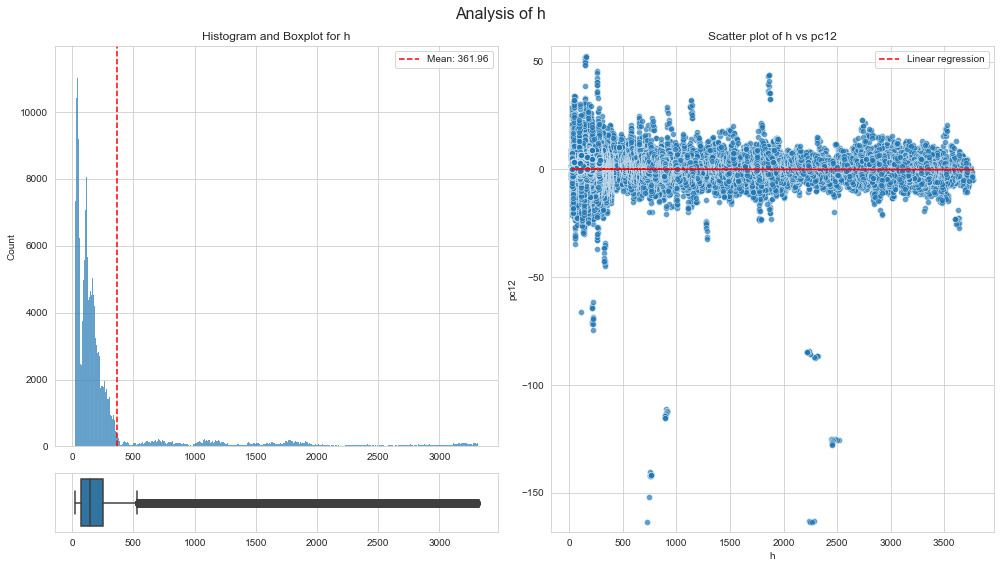

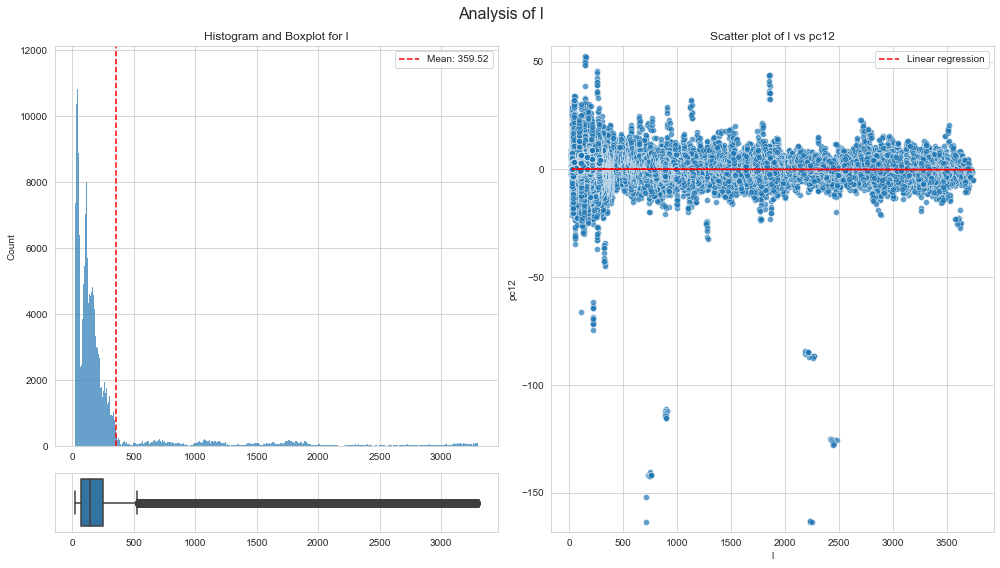

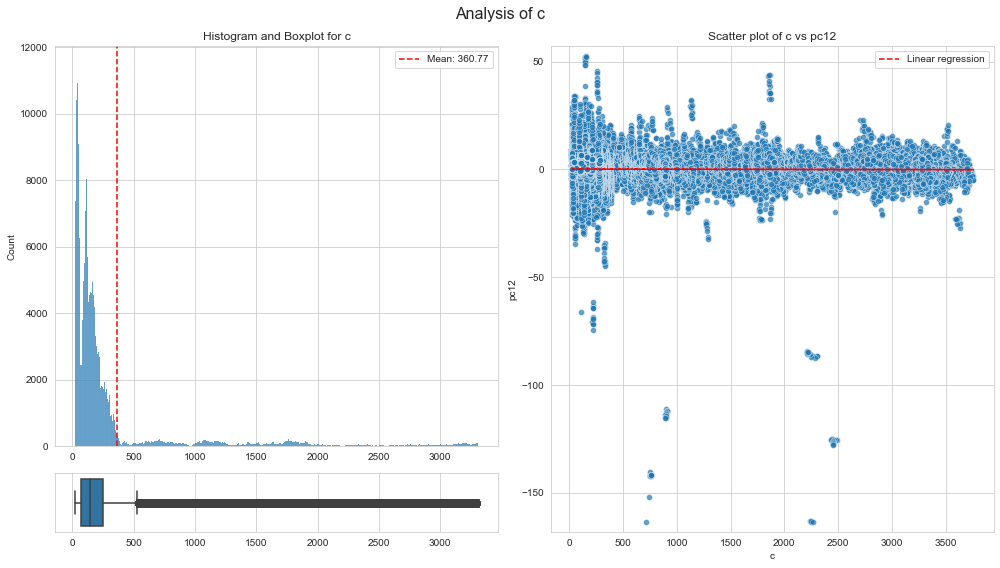

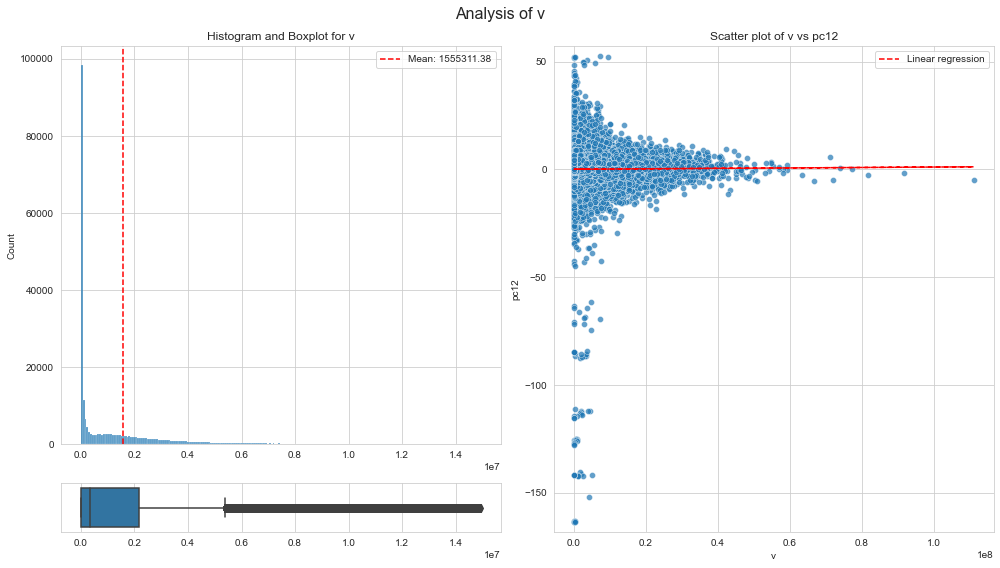

...

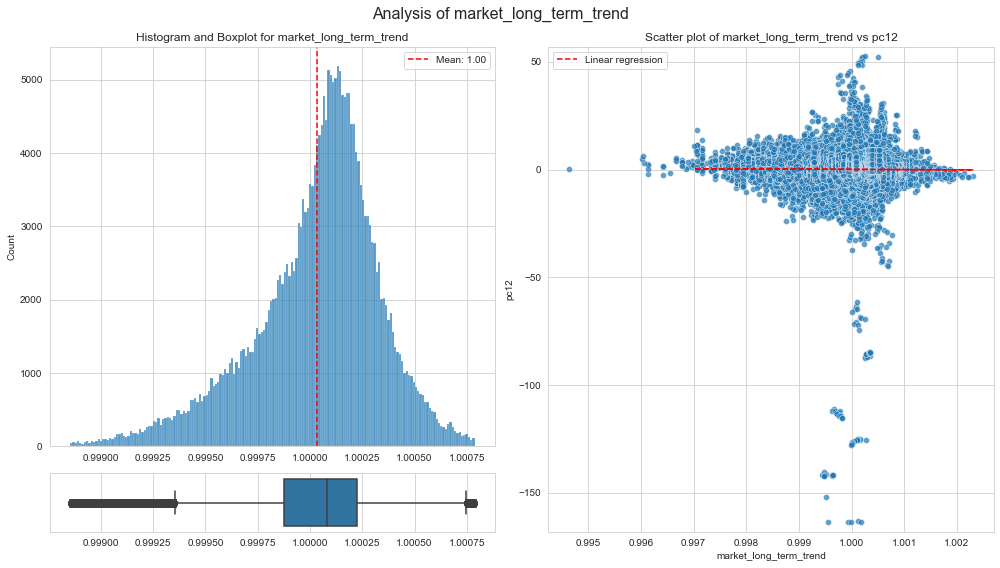

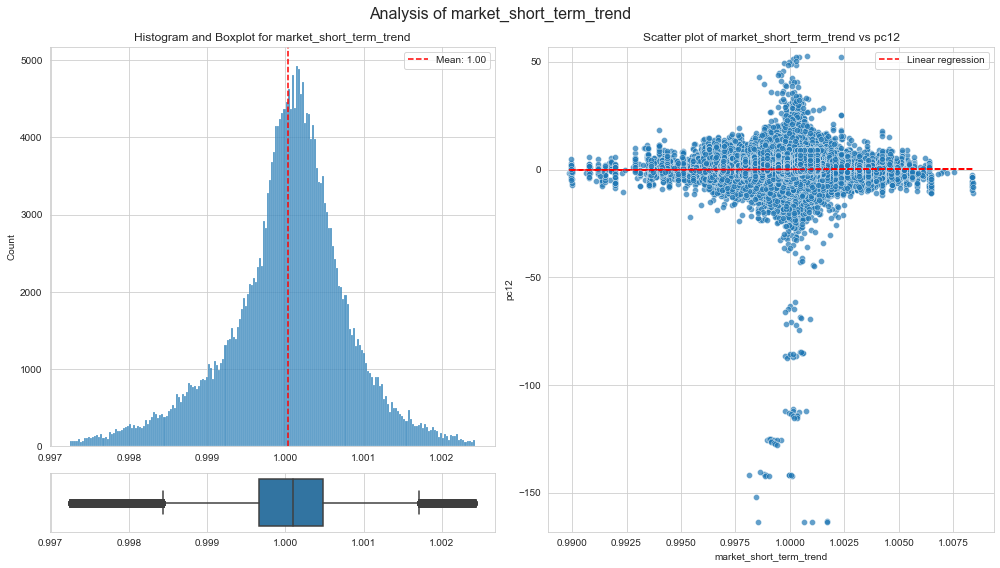

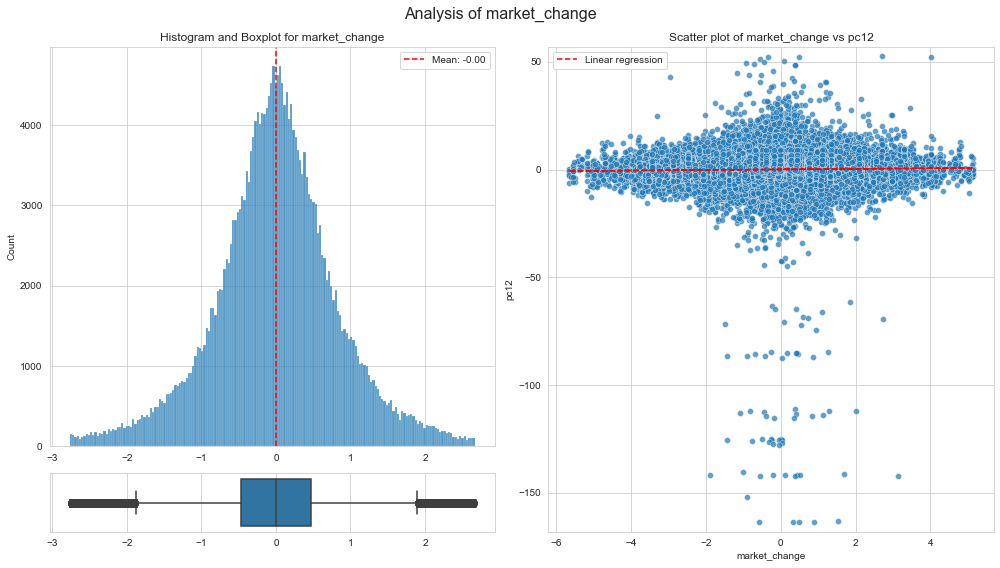

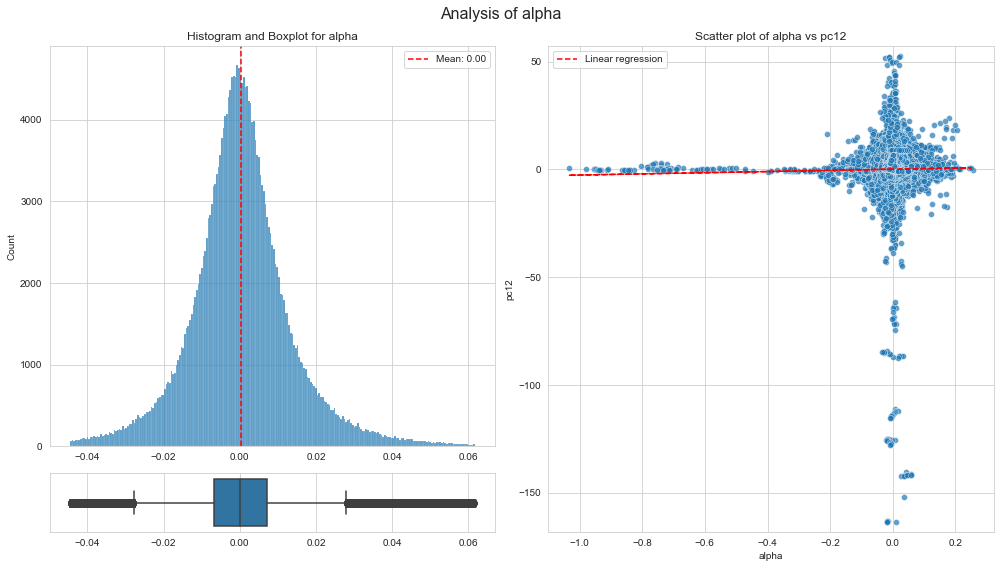

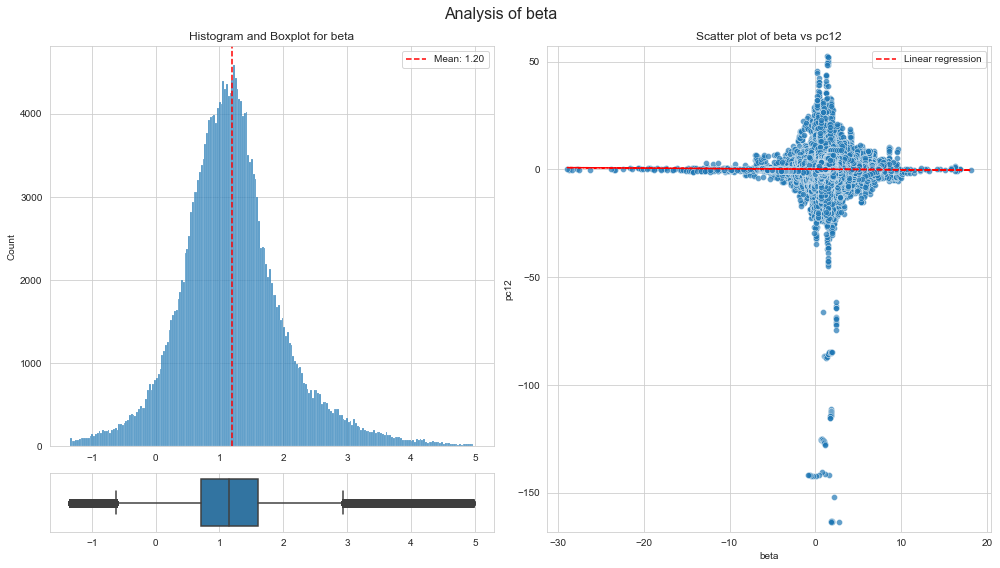

In [13]:
CustomPlotter.combined_plots(
    # df = df.groupby('symbol').get_group('AAPL').reset_index().sort_values(by='pc12', ascending=True)[20:].set_index('t').sort_index(),
    df = df.reset_index().sort_values(by='pc12', ascending=True)[20:].set_index('t').sort_index(),
    columns = df.columns,
    target = 'pc12',
    outlier_drop_pct=1
)

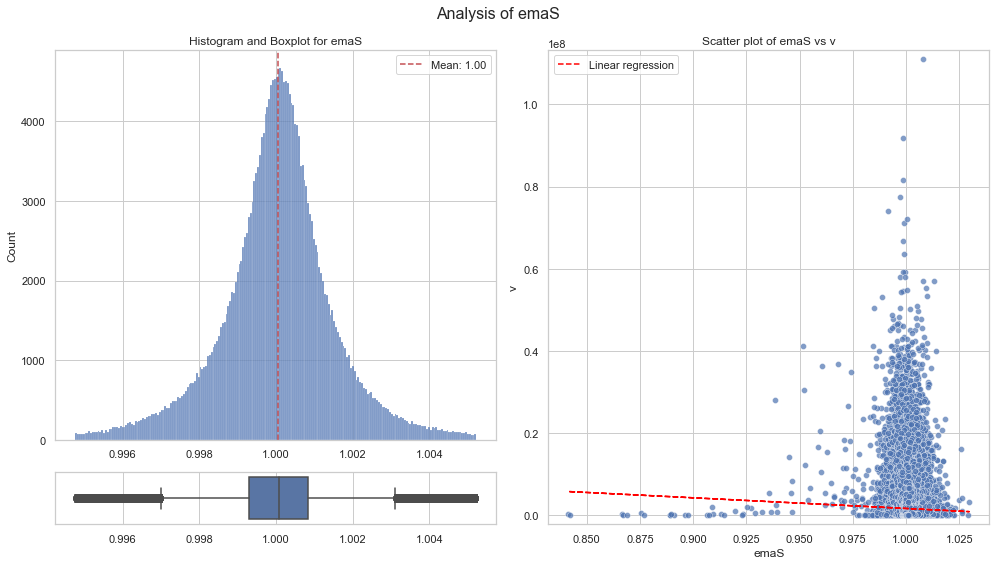

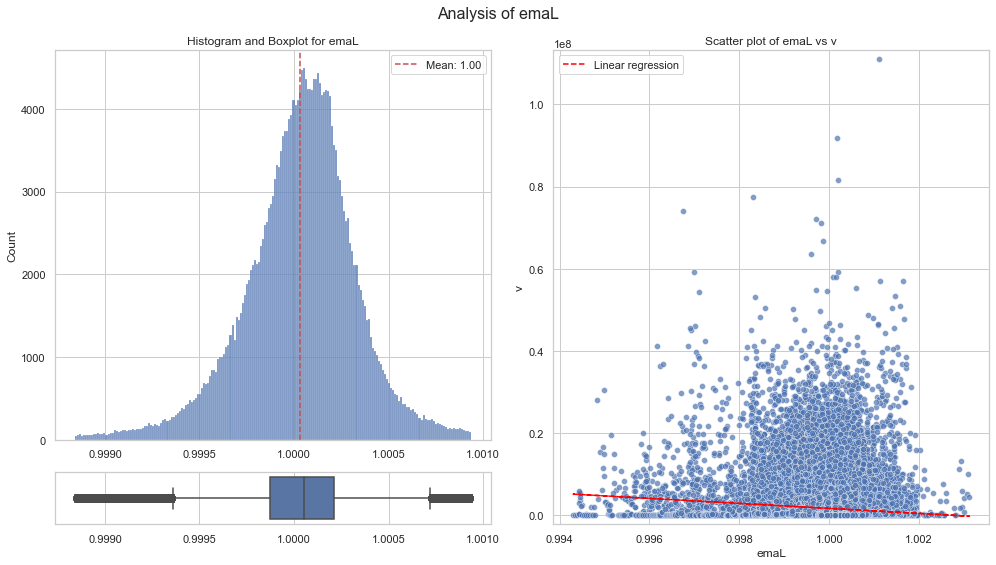

In [99]:
CustomPlotter.combined_plots(
    # df = df.groupby('symbol').get_group('AAPL').reset_index().sort_values(by='pc12', ascending=True)[20:].set_index('t').sort_index(),
    df = df.reset_index().sort_values(by='v', ascending=True)[20:].set_index('t').sort_index(),
    columns = ['emaS', 'emaL'],
    target = 'v',
    outlier_drop_pct=1
)

KeyboardInterrupt: 

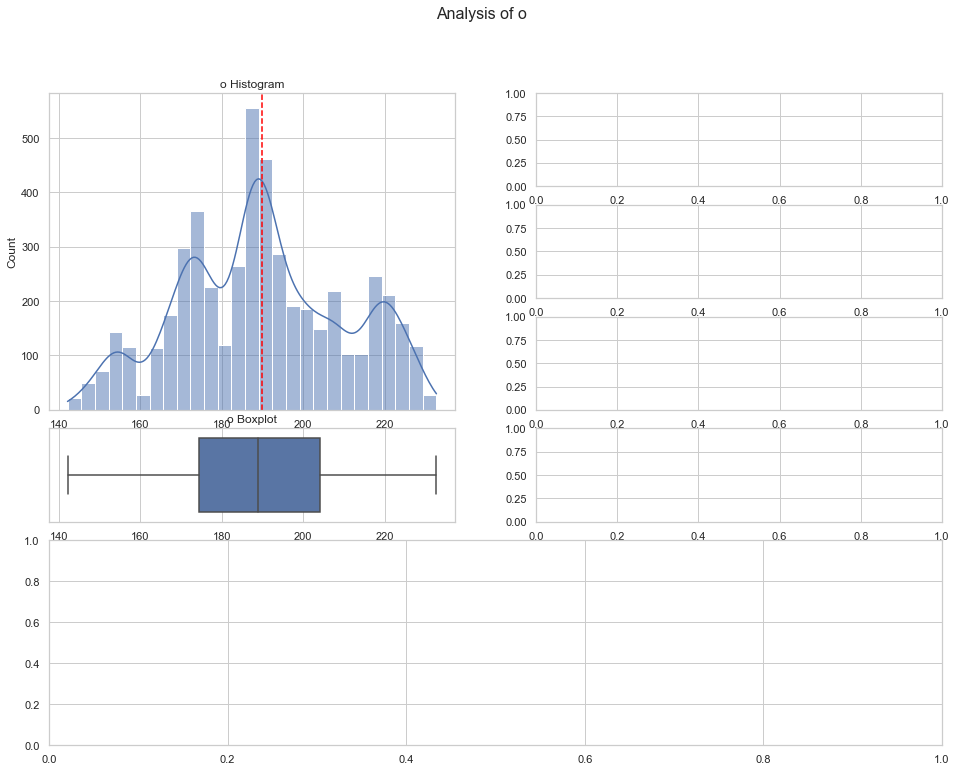

In [26]:
for col in df.columns:
    data = df.groupby('symbol').get_group('AAPL')
    data = data.reset_index()
    data = data.set_index(['t'])

    CustomPlotter.time_series_analysis(data[:5000], col)

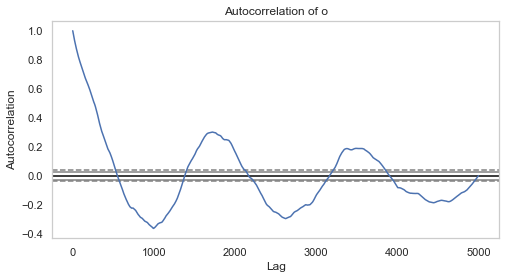

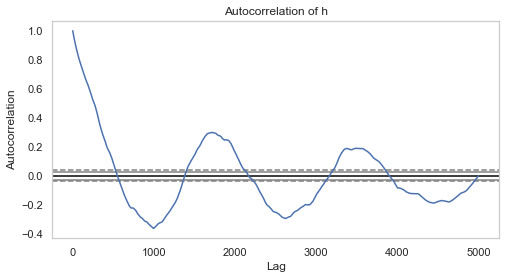

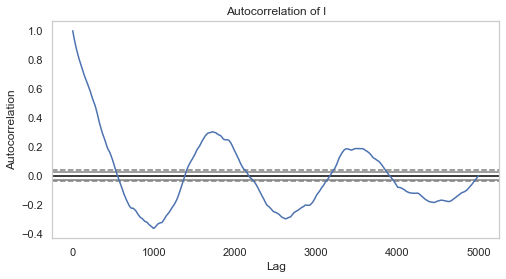

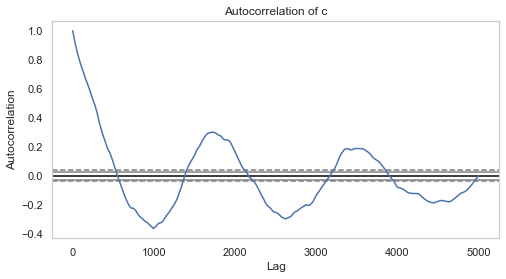

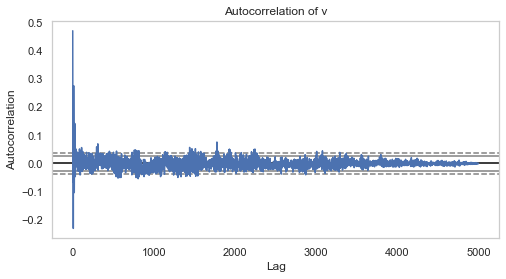

...

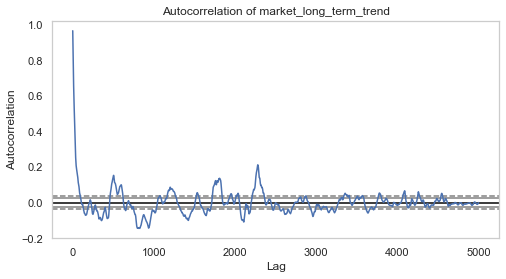

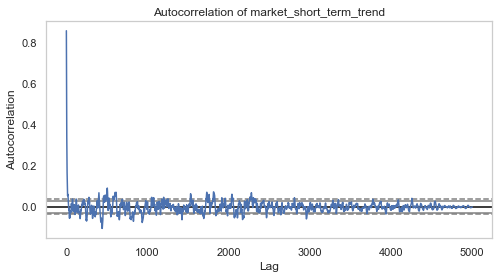

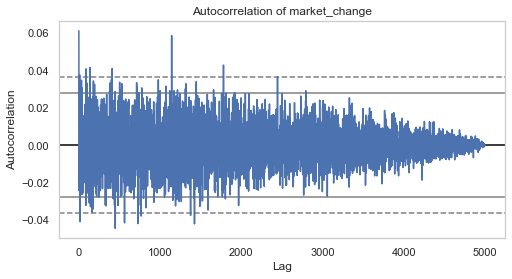

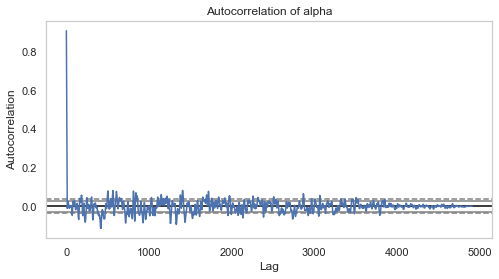

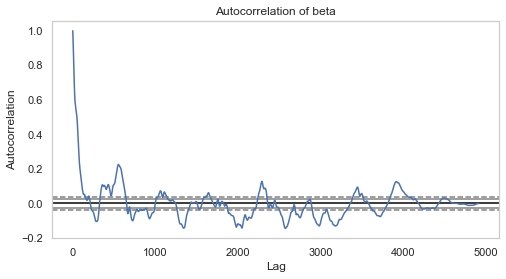

In [27]:
data = df.groupby('symbol').get_group('GOOG').reset_index().set_index(['t']).drop(columns=['symbol'])
CustomPlotter.autocorrelation_analysis(data[:5000])

---

In [112]:
data = df.drop(columns=['o', 'h', 'l', 'c', 'v', 'n', 'vw', 'ema12L'])

In [113]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [31]:
def print_PCA_analysis(df, target):
    X_numeric = df.select_dtypes(include=[np.number]).drop(columns=target).dropna()
    columns = X_numeric.columns.tolist()

    # Standardize the data
    X_standardized = StandardScaler().fit_transform(X_numeric)

    # Perform PCA
    pca = PCA()
    pca.fit(X_standardized)
    X_pca = pca.transform(X_standardized)

    print("\nExplained variance:")
    for i, var in enumerate(pca.explained_variance_ratio_, 1):
        print("Comp. %d: %.2f%s [%.2f%s]" % (i, var * 100, '%', sum(pca.explained_variance_ratio_[:i]) * 100, '%'))
    #print(pca.explained_variance_ratio_)

    pca_weights = pd.DataFrame(pca.components_, columns=columns, index=[f'Comp. {i+1}' for i in range(pca.n_components_)]).T
    return pca.explained_variance_ratio_, pca_weights

In [32]:
pd.options.display.float_format = "{:,.3f}".format

explained_variance, pca_w = print_PCA_analysis(data, 'pc12')
pca_w


Explained variance:
Comp. 1: 15.32% [15.32%]
Comp. 2: 12.94% [28.26%]
Comp. 3: 11.03% [39.29%]
Comp. 4: 6.82% [46.12%]
Comp. 5: 5.96% [52.07%]
Comp. 6: 3.98% [56.06%]
Comp. 7: 3.62% [59.68%]
Comp. 8: 3.30% [62.98%]
Comp. 9: 3.20% [66.18%]
Comp. 10: 2.81% [68.99%]
Comp. 11: 2.52% [71.51%]
Comp. 12: 2.40% [73.91%]
Comp. 13: 2.32% [76.23%]
Comp. 14: 2.26% [78.49%]
Comp. 15: 2.01% [80.50%]
Comp. 16: 1.87% [82.37%]
Comp. 17: 1.75% [84.12%]
Comp. 18: 1.49% [85.61%]
Comp. 19: 1.40% [87.01%]
Comp. 20: 1.38% [88.39%]
Comp. 21: 1.33% [89.73%]
Comp. 22: 1.19% [90.92%]
Comp. 23: 1.10% [92.01%]
Comp. 24: 0.98% [93.00%]
Comp. 25: 0.87% [93.87%]
Comp. 26: 0.84% [94.71%]
Comp. 27: 0.71% [95.42%]
Comp. 28: 0.58% [96.00%]
Comp. 29: 0.58% [96.58%]
Comp. 30: 0.50% [97.08%]
Comp. 31: 0.42% [97.50%]
Comp. 32: 0.41% [97.91%]
Comp. 33: 0.34% [98.24%]
Comp. 34: 0.33% [98.57%]
Comp. 35: 0.31% [98.89%]
Comp. 36: 0.26% [99.15%]
Comp. 37: 0.24% [99.39%]
Comp. 38: 0.23% [99.62%]
Comp. 39: 0.12% [99.75%]
Comp. 40: 

,Comp. 1,Comp. 2,Comp. 3,Comp. 4,Comp. 5,Comp. 6,Comp. 7,Comp. 8,Comp. 9,Comp. 10,...,Comp. 42,Comp. 43,Comp. 44,Comp. 45,Comp. 46,Comp. 47,Comp. 48,Comp. 49,Comp. 50,Comp. 51
diff,-0.004,-0.005,-0.178,-0.158,0.211,-0.038,-0.123,0.015,0.294,-0.276,...,0.022,-0.075,-0.001,-0.001,0.002,0.004,0.000,0.000,0.000,-0.000
emaS,-0.009,-0.010,-0.342,-0.145,0.121,-0.063,-0.046,-0.095,-0.087,0.004,...,-0.060,0.272,0.005,0.001,-0.002,0.007,-0.000,-0.000,0.000,0.000
emaM,-0.011,-0.010,-0.366,0.045,-0.178,-0.009,0.076,0.031,-0.046,-0.016,...,-0.039,-0.280,-0.004,-0.005,-0.000,0.000,0.000,0.000,-0.000,-0.000
emaL,-0.003,-0.011,-0.300,0.144,-0.247,0.052,0.055,0.145,0.146,0.088,...,0.650,0.276,0.003,0.019,0.003,-0.000,0.000,-0.000,-0.000,-0.000
ema12L,-0.003,-0.009,-0.297,0.137,-0.242,0.050,0.053,0.143,0.149,0.091,...,-0.574,-0.171,-0.000,0.002,-0.001,0.000,-0.000,0.000,0.000,0.000
std,0.105,0.106,0.093,-0.295,-0.044,-0.130,0.298,-0.070,-0.055,-0.044,...,0.050,0.009,0.011,0.001,0.000,0.000,0.000,-0.000,0.000,0.000
pc,-0.004,-0.005,-0.158,-0.182,0.257,-0.023,-0.121,0.039,0.328,-0.284,...,0.004,0.002,-0.000,0.001,-0.001,-0.003,-0.000,0.000,-0.000,0.000
mvS,-0.064,0.230,0.031,-0.199,-0.133,-0.221,-0.131,0.182,0.026,0.154,...,-0.022,-0.005,0.145,-0.002,0.000,-0.000,-0.034,-0.597,-0.184,0.211
mvL,-0.120,0.290,0.016,-0.194,-0.115,-0.017,0.060,0.074,-0.083,-0.097,...,-0.002,-0.002,-0.177,-0.003,-0.000,0.000,-0.607,0.043,-0.038,-0.018
mnS,0.077,0.256,0.028,-0.184,-0.128,-0.218,-0.141,0.193,0.029,0.147,...,0.020,0.005,-0.147,0.001,-0.000,0.000,0.036,0.621,0.192,-0.220


In [33]:
pca_weights_scaled = pca_w * explained_variance
pca_weights_scaled.T.abs().sum().sort_values(ascending=False)

lavs                      0.121
macd_std                  0.115
std                       0.115
mnS                       0.114
mvS                       0.113
Net_Profit_Margin         0.112
obvSH                     0.110
mvL                       0.110
ROE                       0.109
Current_Ratio             0.108
Operating_Margin          0.108
P/S                       0.107
Gross_Margin              0.105
market_short_term_trend   0.104
diff                      0.104
macd                      0.103
mnL                       0.103
rsid                      0.103
signal                    0.103
ROA                       0.102
obvsL                     0.102
macds                     0.101
Debt_to_Equity            0.101
spy_value                 0.100
market_correlation        0.099
beta                      0.099
ema12L                    0.099
emaL                      0.098
financial_data_age        0.098
FCF                       0.097
obv                       0.097
obvmS   

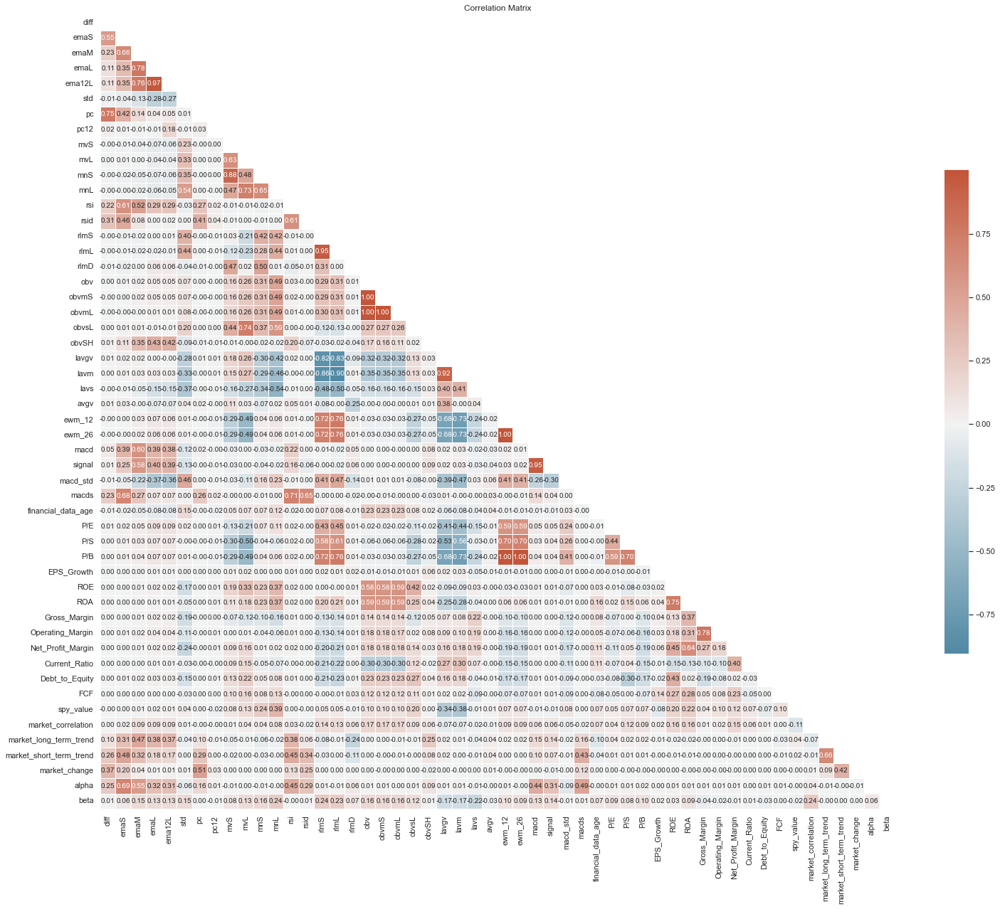

In [34]:
CustomPlotter.plot_corrmatrix(data, figsize=(25, 25))

In [110]:
data.isna().sum()

diff                      0
s                         0
emaS                      0
emaM                      0
emaL                      0
ema12L                    0
std                       0
pc                        0
pc12                      0
mvS                       0
mvL                       0
mnS                       0
mnL                       0
rsi                       0
rsid                      0
rlmS                      0
rlmL                      0
rlmD                      0
obv                       0
obvmS                     0
obvmL                     0
obvsL                     0
obvSH                     0
lavgv                     0
lavm                      0
lavs                      0
avgv                      0
ewm_12                    0
ewm_26                    0
macd                      0
signal                    0
macd_std                  0
macds                     0
financial_data_age        0
P/E                       0
P/S                 

In [111]:
def compute_ig(df, target):
    X_numeric = df.select_dtypes(include=[np.number]).drop(columns=target)
    y = df[target]

    mi_scores = mutual_info_regression(X_numeric, y)
    mi_scores = pd.Series(mi_scores, name="MI_Scores", index=X_numeric.columns)
    mi_scores = mi_scores.sort_values(ascending=False)

    print("\nInformation Gain:")
    print(mi_scores)

compute_ig(data.dropna(), 'pc12')


Information Gain:
financial_data_age   0.053
obvmL                0.046
obvmS                0.040
ema12L               0.038
P/E                  0.038
obv                  0.038
macd_std             0.037
spy_value            0.036
Net_Profit_Margin    0.036
ROE                  0.035
ROA                  0.035
P/S                  0.034
s                    0.034
std                  0.033
Gross_Margin         0.033
ewm_26               0.033
lavm                 0.032
Operating_Margin     0.031
FCF                  0.031
ewm_12               0.031
rlmL                 0.030
obvsL                0.030
P/B                  0.030
Current_Ratio        0.029
Debt_to_Equity       0.027
lavs                 0.021
emaL                 0.020
EPS_Growth           0.014
emaM                 0.012
mnL                  0.011
obvSH                0.011
mvL                  0.009
signal               0.008
macd                 0.007
lavgv                0.006
rlmD                 0.006
macds    

---

In [38]:
def get_cluster_dataset(fit_data: pd.DataFrame, target_df: pd.DataFrame, include_price=True):
    
    """
    rows_selection = [
        'financial_data_age', 'obvmL', 'obvmS', 'ema12L', 'P/E', 'obv', 'macd_std', 'spy_value',
        'Net_Profit_Margin', 'ROE', 'ROA', 'P/S', 's', 'std', 'Gross_Margin'
    ]
    if include_price: rows_selection.append('price')
    """

    rows_selection = target_df.columns
    fit_cluster_data = fit_data[rows_selection]
    target_cluster_df = target_df[rows_selection]
    
    num_cols = fit_cluster_data.select_dtypes(include=[np.number]).columns
    cluster_scaler = StandardScaler().fit(fit_cluster_data[num_cols])
    fit_cluster_data[num_cols] = pd.DataFrame(cluster_scaler.transform(fit_cluster_data[num_cols]), columns=num_cols, index=fit_cluster_data.index)
    target_cluster_df[num_cols] = pd.DataFrame(cluster_scaler.transform(target_cluster_df[num_cols]), columns=num_cols, index=target_cluster_df.index)

    return target_cluster_df

In [39]:
def cluster_analysis(data, labels):
    df = pd.DataFrame({'id': labels})

    noise_instances = (df['id'] == -1).sum()
    total_instances = len(data)
    noise_proportion = noise_instances / total_instances

    # Calculate cluster size statistics
    if -1 in df['id'].value_counts():
        cluster_sizes = df['id'].value_counts().drop(-1)  # Remove the noise cluster
    else:
        cluster_sizes = df['id'].value_counts()
    
    mean_cluster_size = cluster_sizes.mean()
    sd_cluster_size = cluster_sizes.std()
    min_cluster_size = cluster_sizes.min()
    max_cluster_size = cluster_sizes.max()

    # Print the results
    print(f"   -> Number of clusters: {len(set(labels))}")
    print(f"   -> Number of noise instances: {noise_instances} [{(noise_proportion*100):.2f}%]")
    print(f"   -> Mean cluster size: {mean_cluster_size:.2f}")
    print(f"   -> Standard deviation of cluster size: {sd_cluster_size:.2f}")
    print(f"   -> Minimum cluster size: {min_cluster_size}")
    print(f"   -> Maximum cluster size: {max_cluster_size}")

In [40]:
from itertools import product

def find_best_clustering(X, min_samples_values, xi_values):
    best_score = -1
    best_params = None
    best_model = None

    # Generate all possible combinations of hyperparameters
    param_combinations = list(product(min_samples_values, xi_values))

    for min_samples, xi in param_combinations:
        print("#"*50)
        print(f"Testing ms: {min_samples} - xi: {xi}")

        # Initialize and fit the OPTICS model with the current combination of hyperparameters
        model = OPTICS(min_samples=min_samples, xi=xi)
        model.fit(X)

        labels = model.labels_
        cluster_analysis(X, labels)

        # Get the indices of the samples in X that have a valid cluster label
        valid_sample_indices = np.where(labels != -1)

        # Extract the samples with valid cluster labels and their corresponding labels
        X_valid = X.iloc[valid_sample_indices]
        labels_valid = labels[valid_sample_indices]

        if len(np.unique(labels_valid)) > 1:
            # Calculate the silhouette score for the current model
            score = silhouette_score(X_valid, labels_valid)

            print(f" -> Silhoulette Score: {score:.2f}")

            # Update the best score, best parameters, and best model if the current score is better
            if score > best_score:
                print(" -> New best score!")
                best_score = score
                best_params = {'min_samples': min_samples, 'xi': xi}
                best_model = model

    return best_score, best_params, best_model

In [41]:
cluster_data = get_cluster_dataset(data, data)
cluster_data.head()

,,diff,emaS,emaM,emaL,ema12L,std,pc,pc12,mvS,mvL,...,Current_Ratio,Debt_to_Equity,FCF,spy_value,market_correlation,market_long_term_trend,market_short_term_trend,market_change,alpha,beta
t,symbol,,,,,,,,,,,,,,,,,,,,,
2018-01-02 09:00:00,BABA,0.714,0.393,0.050,-0.190,0.282,-0.375,1.327,3.200,-0.791,-0.177,...,-0.354,-0.397,2.004,-1.333,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-02 10:00:00,BABA,0.346,0.509,0.122,-0.153,0.352,-0.379,0.653,3.144,-0.990,-0.197,...,-0.354,-0.397,2.004,-1.332,1.105,0.057,0.020,NaN,NaN,NaN
2018-01-02 11:00:00,BABA,0.368,0.617,0.197,-0.113,0.419,-0.383,0.690,3.059,-1.124,-0.214,...,-0.354,-0.397,2.004,-1.329,0.841,1.330,0.541,0.753,NaN,NaN
2018-01-02 12:00:00,BABA,0.210,0.625,0.237,-0.091,0.485,-0.388,0.399,3.020,-1.026,-0.218,...,-0.354,-0.397,2.004,-1.325,0.938,1.622,0.655,0.455,NaN,NaN
2018-01-02 13:00:00,BABA,0.271,0.663,0.289,-0.062,0.550,-0.393,0.510,3.005,-0.890,-0.219,...,-0.354,-0.397,2.004,-1.323,1.012,1.653,0.657,0.101,NaN,NaN


In [135]:
# Define the range of hyperparameter values to search through
min_samples_values = [5, 25, 50, 100, 200, 500]
xi_values = [0.000001]

# Find the best clustering model
best_score, best_params, best_model = find_best_clustering(
    cluster_data[cluster_data.index.get_level_values('symbol') == 'AAPL'].dropna(),
    [5, 25, 50, 100, 200, 500],
    [0.0000001]
)

print(f"Best Silhouette Score: {best_score}")
print(f"Best Parameters: {best_params}")

##################################################
Testing ms: 5 - xi: 1e-07
   -> Number of clusters: 992
   -> Number of noise instances: 11555 [4.54%]
   -> Mean cluster size: 7.88
   -> Standard deviation of cluster size: 3.43
   -> Minimum cluster size: 5
   -> Maximum cluster size: 27
 -> Silhoulette Score: 0.28
 -> New best score!
##################################################
Testing ms: 25 - xi: 1e-07
   -> Number of clusters: 64
   -> Number of noise instances: 15321 [6.03%]
   -> Mean cluster size: 64.21
   -> Standard deviation of cluster size: 77.02
   -> Minimum cluster size: 26
   -> Maximum cluster size: 583
 -> Silhoulette Score: 0.20
##################################################
Testing ms: 50 - xi: 1e-07
   -> Number of clusters: 25
   -> Number of noise instances: 12401 [4.88%]
   -> Mean cluster size: 290.21
   -> Standard deviation of cluster size: 396.54
   -> Minimum cluster size: 51
   -> Maximum cluster size: 1517
 -> Silhoulette Score: 0.15
#########

In [100]:
best_score, best_params, best_model = find_best_clustering(
    cluster_data.sample(int(len(cluster_data) * 0.10)).dropna(),
    [50],
    [0.0000001]
)

##################################################
Testing ms: 50 - xi: 1e-07
   -> Number of clusters: 30
   -> Number of noise instances: 16212 [75.99%]
   -> Mean cluster size: 176.62
   -> Standard deviation of cluster size: 174.10
   -> Minimum cluster size: 50
   -> Maximum cluster size: 614
 -> Silhoulette Score: 0.22
 -> New best score!


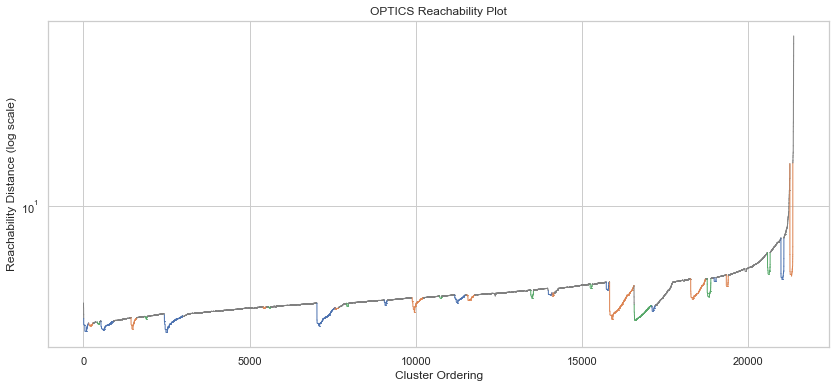

In [44]:
# Extract reachability distances, cluster ordering, and labels
reachability = best_model.reachability_[best_model.ordering_]
cluster_ordering = np.arange(len(reachability))
labels = best_model.labels_[best_model.ordering_]

# Assign colors based on cluster labels
colors = np.where(labels == -1, 'gray', None)
unique_clusters = np.unique(labels[labels != -1])

for i, cluster in enumerate(unique_clusters):
    colors[labels == cluster] = ['C0', 'C1', 'C2'][i % 3]

sn.set_style('whitegrid')

# Create the plot
fig, ax = plt.subplots(figsize=(14, 6))

# Plot each segment of the line with its corresponding color
for i in range(1, len(reachability)):
    ax.plot(cluster_ordering[i-1:i+1], reachability[i-1:i+1], lw=1, color=colors[i-1])

# Set the y-axis to logarithmic scale
ax.set_yscale('log')

plt.title('OPTICS Reachability Plot')
plt.xlabel('Cluster Ordering')
plt.ylabel('Reachability Distance (log scale)')

plt.show()


---

In [114]:
data.columns

Index(['diff', 'emaS', 'emaM', 'emaL', 'std', 'pc', 'pc12', 'mvS', 'mvL',
       'mnS', 'mnL', 'rsi', 'rsid', 'rlmS', 'rlmL', 'rlmD', 'obv', 'obvmS',
       'obvmL', 'obvsL', 'obvSH', 'lavgv', 'lavm', 'lavs', 'avgv', 'ewm_12',
       'ewm_26', 'macd', 'signal', 'macd_std', 'macds', 'financial_data_age',
       'P/E', 'P/S', 'P/B', 'EPS_Growth', 'ROE', 'ROA', 'Gross_Margin',
       'Operating_Margin', 'Net_Profit_Margin', 'Current_Ratio',
       'Debt_to_Equity', 'FCF', 'spy_value', 'market_correlation',
       'market_long_term_trend', 'market_short_term_trend', 'market_change',
       'alpha', 'beta'],
      dtype='object')

In [115]:
data.index.get_level_values('t').min()
data.index.get_level_values('t').max()

timestamps = data.index.get_level_values('t')
min_timestamp = timestamps.min()
max_timestamp = timestamps.max()

# Find the timestamp that is 80% of the way between the min and max
threshold_timestamp = min_timestamp + 0.8 * (max_timestamp - min_timestamp)
print("80% division timestamp:", threshold_timestamp)


80% division timestamp: 2022-03-14 01:00:00


In [116]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import catboost as cat

# Split the data
X = data.drop('pc12', axis=1)
y = data['pc12']
X_train = X[X.index.get_level_values('t') <= threshold_timestamp]
X_test = X[X.index.get_level_values('t') > threshold_timestamp]
y_train = y[X.index.get_level_values('t') <= threshold_timestamp]
y_test = y[X.index.get_level_values('t') > threshold_timestamp]

# Apply Standard Scaler
labels_scaler = StandardScaler()
X_train_scaled = labels_scaler.fit_transform(X_train)
X_test_scaled = labels_scaler.transform(X_test)

targets_scaler = StandardScaler()
y_train_scaled = targets_scaler.fit_transform(y_train.to_numpy().reshape(-1, 1))
y_test_scaled = targets_scaler.transform(y_test.to_numpy().reshape(-1, 1))

print(X_train_scaled.shape)
print(X_test_scaled.shape)
print(y_train_scaled.shape)
print(y_test_scaled.shape)

(195740, 50)
(58525, 50)
(195740, 1)
(58525, 1)


In [122]:
cat.cv(
    cat.Pool(X_train_scaled, y_train_scaled),
    {
        'learning_rate': 0.05,
        'iterations': 10000,
        'loss_function': 'RMSE',
        'early_stopping_rounds': 50,
    },
    fold_count=5,
    plot=True,
    verbose=500
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/5]
0:	learn: 1.0016501	test: 0.9773098	best: 0.9773098 (0)	total: 20.3ms	remaining: 3m 22s
500:	learn: 0.8136406	test: 0.8383813	best: 0.8383813 (500)	total: 7.5s	remaining: 2m 22s
1000:	learn: 0.7480547	test: 0.7850816	best: 0.7850816 (1000)	total: 14.6s	remaining: 2m 11s
1500:	learn: 0.7014821	test: 0.7475165	best: 0.7475165 (1500)	total: 21.6s	remaining: 2m 2s
2000:	learn: 0.6633341	test: 0.7172013	best: 0.7172013 (2000)	total: 29.7s	remaining: 1m 58s
2500:	learn: 0.6309888	test: 0.6917818	best: 0.6917818 (2500)	total: 37.4s	remaining: 1m 52s
3000:	learn: 0.6028634	test: 0.6695659	best: 0.6695659 (3000)	total: 44.4s	remaining: 1m 43s
3500:	learn: 0.5779246	test: 0.6503884	best: 0.6503884 (3500)	total: 51.4s	remaining: 1m 35s
4000:	learn: 0.5554957	test: 0.6330443	best: 0.6330443 (4000)	total: 58.7s	remaining: 1m 27s
4500:	learn: 0.5353409	test: 0.6178892	best: 0.6178892 (4500)	total: 1m 5s	remaining: 1m 20s
5000:	learn: 0.5168400	test: 0.6034938	best: 0.6034938 (

In [118]:
# Train CatBoost Regressor with fancy visuals
model = cat.CatBoostRegressor(iterations=4500, learning_rate=0.05, verbose=500)
model.fit(X_train_scaled, y_train_scaled, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9966030	total: 21.9ms	remaining: 1m 38s
500:	learn: 0.8148381	total: 6.65s	remaining: 53s
1000:	learn: 0.7514891	total: 12.9s	remaining: 45.1s
1500:	learn: 0.7037602	total: 19.6s	remaining: 39.1s
2000:	learn: 0.6661331	total: 26.2s	remaining: 32.7s
2500:	learn: 0.6340348	total: 32.7s	remaining: 26.2s
3000:	learn: 0.6055942	total: 39.6s	remaining: 19.8s
3500:	learn: 0.5813407	total: 46.8s	remaining: 13.3s
4000:	learn: 0.5597581	total: 54.4s	remaining: 6.79s
4499:	learn: 0.5393292	total: 1m 1s	remaining: 0us


In [119]:
# Evaluate using MSE
y_pred_train = model.predict(X_train_scaled)
y_pred_test = model.predict(X_test_scaled)
mse_train = mean_squared_error(y_train_scaled, y_pred_train)
mse_test = mean_squared_error(y_test_scaled, y_pred_test)
print(f'Train MSE: {mse_train:.2f}')
print(f'Test MSE: {mse_test:.2f}')

# Predict the test dataset
test_predictions = targets_scaler.inverse_transform(model.predict(X_test_scaled).reshape(-1, 1))
test_targets = y_test.to_numpy()

train_predictions = targets_scaler.inverse_transform(model.predict(X_train_scaled).reshape(-1, 1))
train_targets = y_train.to_numpy()

Train MSE: 0.29
Test MSE: 1.84


In [91]:
pd.options.display.float_format = "{:,.3f}".format

def plot_predictions(train_predictions, train_targets, test_predictions, test_targets):
    plt.figure(figsize=(12, 6))
    sn.set_style("whitegrid")

    plt.scatter(train_targets.flatten(), train_predictions.flatten(), alpha=0.5, label="Train")
    plt.scatter(test_targets.flatten(), test_predictions.flatten(), alpha=0.5, label="Test")

    targets = np.concatenate((train_targets, test_targets)).flatten()
    predictions = np.concatenate((train_predictions, test_predictions)).flatten()

    lin_reg = LinearRegression()
    lin_reg.fit(targets.reshape(-1, 1), predictions.reshape(-1, 1))
    y_pred_reg = lin_reg.predict(targets.reshape(-1, 1))

    plt.plot(targets, y_pred_reg, color='red', linestyle='--', label='Linear regression')

    plt.xlabel('Expected Value')
    plt.ylabel('Predicted Value')
    plt.title('Scatter Plot of Expected Value vs Predicted Value')
    plt.legend()
    plt.show()

def print_metrics(train_predictions, train_targets, test_predictions, test_targets):
    results = {}

    for name, pred, targ in zip(
        ["Train", "Test"],
        [train_predictions, test_predictions],
        [train_targets, test_targets],
    ):
        results[name] = {
            "r2": r2_score(targ.flatten(), pred.flatten()),
            "rmse": np.sqrt(mean_squared_error(targ.flatten(), pred.flatten())),
            "mae": mean_absolute_error(targ.flatten(), pred.flatten()),
            "mse": mean_squared_error(targ.flatten(), pred.flatten()),
        }

    return pd.DataFrame(results)

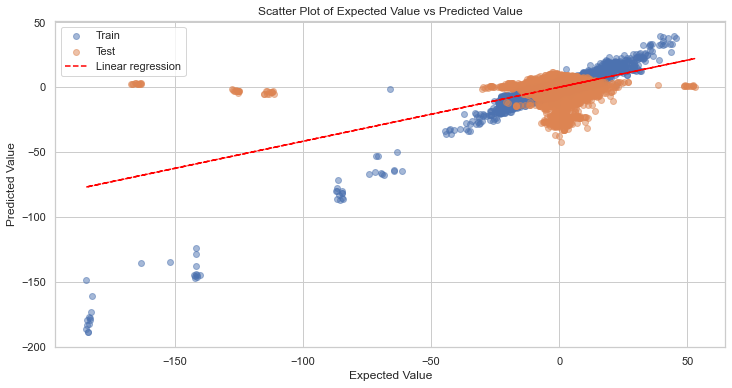

,Train,Test
r2,0.709,-0.384
rmse,2.398,6.034
mae,1.822,3.737
mse,5.753,36.410


In [120]:
plot_predictions(
    train_predictions, train_targets,
    test_predictions, test_targets,
)
print_metrics(
    train_predictions, train_targets,
    test_predictions, test_targets,
)

---

In [101]:
import shap
shap.initjs()

In [108]:
cat_data = pd.DataFrame(X_train_scaled, columns=data.drop(columns=['pc12']).columns)
explainer_cat = shap.TreeExplainer(model)
explainer_cat

In [109]:
shap_values_cat = explainer_cat.shap_values(cat_data)

In [110]:
shap.force_plot(explainer_cat.expected_value, shap_values_cat[0,:], cat_data.iloc[0,:])

In [106]:
shap.force_plot(explainer_cat.expected_value, shap_values_cat[0:1000], cat_data[0:1000])